In [1]:
import warnings
warnings.filterwarnings("ignore")

import rasterio as rio
import rasterio.plot as rio_plot
import matplotlib.pyplot as plt
import os
from pathlib import Path
import numpy as np
import geopandas as gpd

# Satellite data

Mostly cloudless Sentinel 2 mosaics were acquired from [Copernicus Open Access Hub](https://scihub.copernicus.eu/dhus/#/home) as L1C products, which were then converted to RGB mosaics with similar color corrections that are used in [Tarkka](https://syke.fi/tarkka) service. 

The following mosaics were used as the training and validation data:

|Location|Sentinel 2 Tile ID|Date|Product name|CRS|Number of annotations|
|--------|------------------|----|------------|---|---------------------|
|Archipelago sea|34VEM|19.06.2022|S2B_MSIL1C_20220619T100029_N0400_R122_T34VEM_20220619T104419|EPSG:32634|485|
|Archipelago sea|34VEM|21.07.2022|S2A_MSIL1C_20220721T095041_N0400_R079_T34VEM_20220721T115325|EPSG:32634|1317|
|Archipelago sea|34VEM|13.08.2022|S2A_MSIL1C_20220813T095601_N0400_R122_T34VEM_20220813T120233|EPSG:32634|1205|
|Gulf of Finland|35VLG|06.06.2022|S2B_MSIL1C_20220606T095029_N0400_R079_T35VLG_20220606T105944|EPSG:32635|257|
|Gulf of Finland|35VLG|26.06.2022|S2B_MSIL1C_20220626T095039_N0400_R079_T35VLG_20220626T104321|EPSG:32635|1097|
|Gulf of Finland|35VLG|21.07.2022|S2A_MSIL1C_20220721T095041_N0400_R079_T35VLG_20220721T115325|EPSG:32635|867|
|Bothnian Bay   |34WFT|27.06.2022|S2A_MSIL1C_20220627T100611_N0400_R022_T34WFT_20220627T134958|EPSG:32634|112|
|Bothnian Bay   |34WFT|12.07.2022|S2B_MSIL1C_20220712T100559_N0400_R022_T34WFT_20220712T121613|EPSG:32634|149|
|Bothnian Bay   |34WFT|28.08.2022|S2B_MSIL1C_20220828T095549_N0400_R122_T34WFT_20220828T104748|EPSG:32634|72|

The following mosaics were used as test data:

|Location|Sentinel 2 Tile ID|Date|Product name|CRS|Number of annotations|
|--------|------------------|----|------------|---|---------------------|
|Archipelago sea|34VEN|14.07.2021|S2B_MSIL1C_20210714T100029_N0301_R122_T34VEN_20210714T121056|EPSG:32634|558|
|Archipelago sea|34VEN|24.06.2022|S2A_MSIL1C_20220624T100041_N0400_R122_T34VEN_20220624T120211|EPSG:32634|575|
|Archipelago sea|34VEN|13.08.2022|S2A_MSIL1C_20220813T095601_N0400_R122_T34VEN_20220813T120233|EPSG:32634|581|
|Kvarken|34VER|17.06.2022|S2A_MSIL1C_20220826T100611_N0400_R022_T34VER_20220826T135136|EPSG:32634|66|
|Kvarken|34VER|12.07.2022|S2B_MSIL1C_20220712T100559_N0400_R022_T34VER_20220712T121613|EPSG:32634|152|
|Kvarken|34VER|26.08.2022|S2A_MSIL1C_20220826T100611_N0400_R022_T34VER_20220826T135136|EPSG:32634|67|

# Ship and boat data 

We manually annotated all visible boats and ships from the RGB satellite mosaics from X Sentinel 2 grid tiles by drawing a bounding box around them, and saved them into shapefiles so that each shapefile corresponded to a single RGB mosaic. Each grid tile was annotated from three separate time periods in order to capture more diverse conditions in the sea and different cloud coverage. Images from multiple acquisition dates were also used to identify smaller boats: As these boats only cover a couple of pixels, the identification was done by comparing several images and if a potential boat was not present in all images, it was annotated. The grid tiles were split into train, validation and test sets so that train set contained x tiles, validation set contained y tiles and test set contained z tiles.

As it is easier to just leave `id` empty in QGIS, add the information to shapefiles.

In [3]:
image_path = Path('../data/rgb_mosaics/')
shp_path = Path('../data/annotated_ships')

for t_id in ['34VEM', '35VLG', '34WFT', '34VEN', '34VER']:
    mosaics = [f for f in os.listdir(image_path/t_id) if 'tif' in f]
    for t in mosaics:
        ships = gpd.read_file(shp_path/t_id/t.replace('tif', 'shp'))
        ships['id'] = 'boat'
        ships.to_file(shp_path/t_id/t.replace('tif', 'shp'))

## Train and validation areas

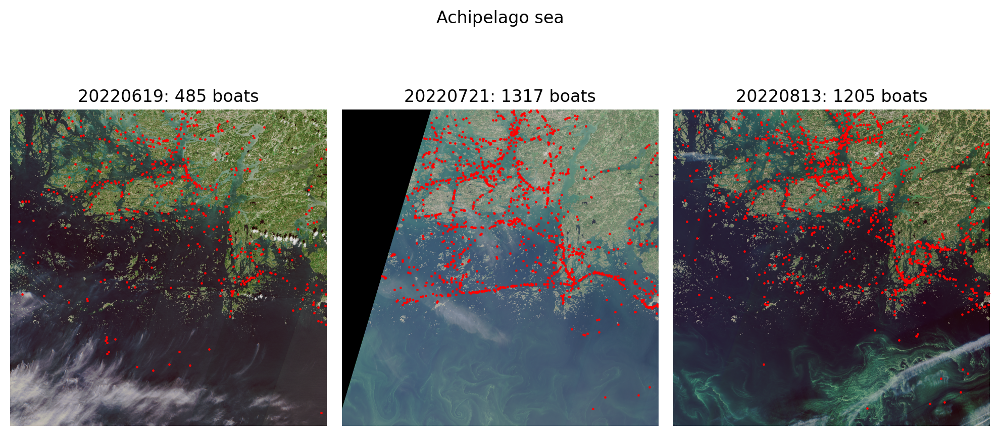

In [4]:
fig, axs = plt.subplots(1,3, dpi=200, figsize=(10,5))
for t, a in zip(['20220619.tif','20220721.tif', '20220813.tif'], axs):
    a.axis('off')
    with rio.open(image_path/'34VEM'/t) as src:
        rio_plot.show(src, ax=a)
    ships = gpd.read_file(shp_path/'34VEM'/t.replace('tif', 'shp'))
    ships['geometry'] = ships.geometry.centroid
    ships.plot(ax=a, color='red', markersize=.5)
    n_ships = len(ships)
    ships = None
    a.set_title(f'{t[:-4]}: {n_ships} boats')
plt.suptitle('Achipelago sea')
plt.tight_layout()
plt.show()

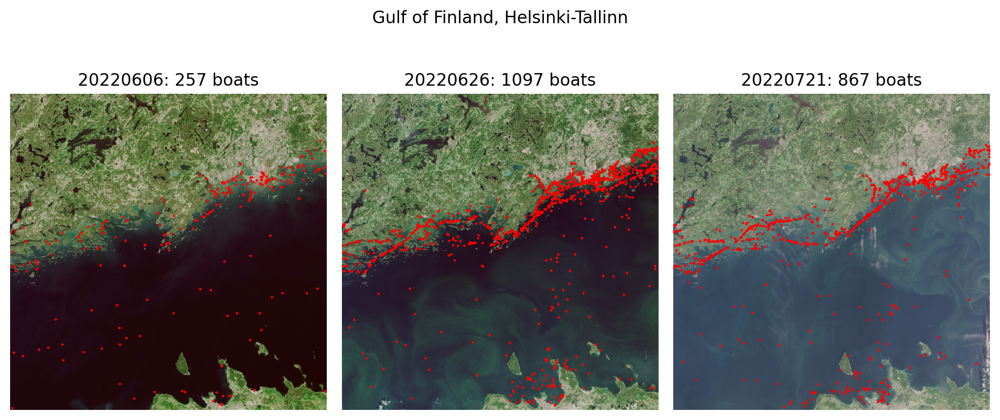

In [5]:
fig, axs = plt.subplots(1,3, dpi=200, figsize=(10,5))
for t, a in zip(['20220606.tif','20220626.tif', '20220721.tif'], axs):
    a.axis('off')
    with rio.open(image_path/'35VLG'/t) as src:
        rio_plot.show(src, ax=a)
    ships = gpd.read_file(shp_path/'35VLG'/t.replace('tif', 'shp'))
    ships['geometry'] = ships.geometry.centroid
    ships.plot(ax=a, color='red', markersize=.5)
    n_ships = len(ships)
    ships = None
    a.set_title(f'{t[:-4]}: {n_ships} boats')
plt.tight_layout()
plt.suptitle('Gulf of Finland, Helsinki-Tallinn')
plt.show()

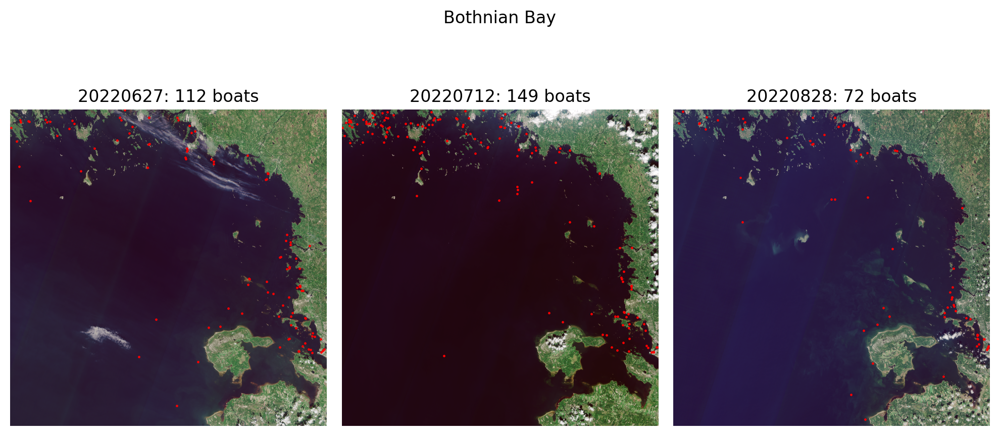

In [6]:
fig, axs = plt.subplots(1,3, dpi=200, figsize=(10,5))
for t, a in zip(['20220627.tif','20220712.tif', '20220828.tif'], axs):
    a.axis('off')
    with rio.open(image_path/'34WFT'/t) as src:
        rio_plot.show(src, ax=a)
    ships = gpd.read_file(shp_path/'34WFT'/t.replace('tif', 'shp'))
    ships['geometry'] = ships.geometry.centroid
    ships.plot(ax=a, color='red', markersize=.5)
    n_ships = len(ships)
    ships = None
    a.set_title(f'{t[:-4]}: {n_ships} boats')
plt.suptitle('Bothnian Bay')
plt.tight_layout()
plt.show()

## Test areas

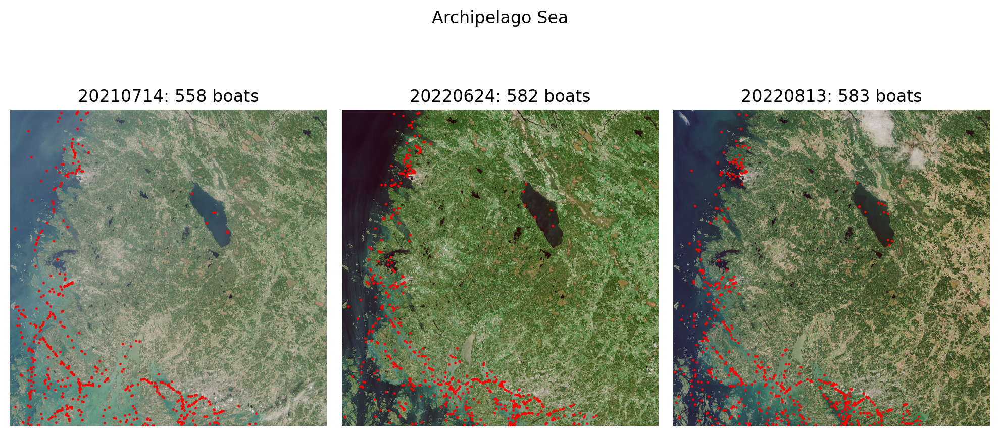

In [7]:
fig, axs = plt.subplots(1,3, dpi=200, figsize=(10,5))
for t, a in zip(['20210714.tif', '20220624.tif', '20220813.tif'], axs):
    a.axis('off')
    with rio.open(image_path/'34VEN'/t) as src:
        rio_plot.show(src, ax=a)
    ships = gpd.read_file(shp_path/'34VEN'/t.replace('tif', 'shp'))
    ships['geometry'] = ships.geometry.centroid
    ships.plot(ax=a, color='red', markersize=.5)
    n_ships = len(ships)
    ships = None
    a.set_title(f'{t[:-4]}: {n_ships} boats')
plt.suptitle('Archipelago Sea')
plt.tight_layout()
plt.show()

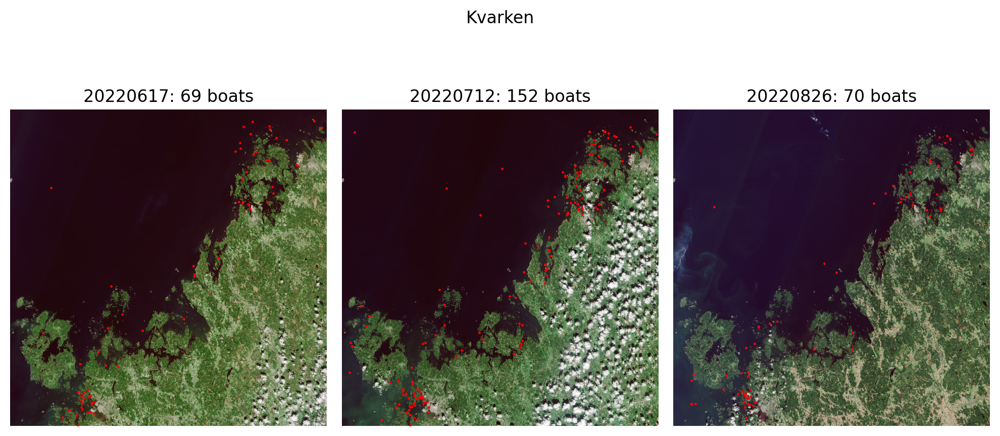

In [8]:
fig, axs = plt.subplots(1,3, dpi=200, figsize=(10,5))
for t, a in zip(['20220617.tif', '20220712.tif', '20220826.tif'], axs):
    a.axis('off')
    with rio.open(image_path/'34VER'/t) as src:
        rio_plot.show(src, ax=a)
    ships = gpd.read_file(shp_path/'34VER'/t.replace('tif', 'shp'))
    ships['geometry'] = ships.geometry.centroid
    ships.plot(ax=a, color='red', markersize=.5)
    n_ships = len(ships)
    ships = None
    a.set_title(f'{t[:-4]}: {n_ships} boats')
plt.suptitle('Kvarken')
plt.tight_layout()
plt.show()

# Training and validation data generation

[drone_detector](https://mayrajeo.github.io/drone_detector) package provides utilities for converting geospatial data to formats accepted by different deep learning frameworks. In this work, [YOLOv8](https://github.com/ultralytics/ultralytics) is used as the detection model, so the data must be converted to YOLO format. 

First step is to tile the data into smaller patches. `drone_detector.processing.tiling.Tiler` does this. Then data is converted to YOLO specifications with `drone_detector.processing.yolo.YOLOProcessor`.

In [ ]:
from drone_detector.processing.tiling import Tiler
from drone_detector.processing.yolo import *

We need to specify some datapaths, tilesize (here 320x320px) and overlap (here (0,0)).

In [ ]:
#| output: false

tilesize = 320
overlap = (0,0)

outpath = Path('../data/processed/')

for t in ['20220619','20220721', '20220813']:
    tiler = Tiler(outpath/'34VEM'/t, gridsize_x=tilesize, gridsize_y=tilesize, overlap=overlap)
    tiler.tile_raster(image_path/'34VEM'/f'{t}.tif')
    tiler.tile_vector(shp_path/'34VEM'/f'{t}.shp')
    cats = ['boat']
    yolo_proc = YOLOProcessor(outpath/'34VEM'/t, outpath/'34VEM'/t, cats)
    yolo_proc.from_shp('id', ann_format='box')
    
grid_34vem = tiler.grid
    
for t in ['20220606','20220626', '20220721']:
    tiler = Tiler(outpath/'35VLG'/t, gridsize_x=tilesize, gridsize_y=tilesize, overlap=overlap)
    tiler.tile_raster(image_path/'35VLG'/f'{t}.tif')
    tiler.tile_vector(shp_path/'35VLG'/f'{t}.shp')
    cats = ['boat']
    yolo_proc = YOLOProcessor(outpath/'35VLG'/t, outpath/'35VLG'/t, cats)
    yolo_proc.from_shp('id', ann_format='box')
    
grid_35vlg = tiler.grid

for t in ['20220627','20220712', '20220828']:
    tiler = Tiler(outpath/'34WFT'/t, gridsize_x=tilesize, gridsize_y=tilesize, overlap=overlap)
    tiler.tile_raster(image_path/'34WFT'/f'{t}.tif')
    tiler.tile_vector(shp_path/'34WFT'/f'{t}.shp')
    cats = ['boat']
    yolo_proc = YOLOProcessor(outpath/'34WFT'/t, outpath/'34WFT'/t, cats)
    yolo_proc.from_shp('id', ann_format='box')
    
grid_34wft = tiler.grid

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

`yaml`-file that defines the datasets is still a work in progress so we need to do it manually. Folder format is the following:

```
processed-|
          |tile_id|
                  |date-|
                  |     |-images # patches as 320x320px tif files
                  |     |-labels # annotations in yolo format
                  |     |-vectors # annotations in geojson format
                  |     |yolo.yaml # yaml file for yolo dataset for this folder
          ...
          |yolo.yaml # we need this file to have both folders in a single dataset
          |train.txt
          |val.txt
```

From these tiles, split them into five equal sized folds so that:

* All folds contain data from all timesteps and locations
* All patches in both sets are unique to prevent data leakage
* All patches that contain a boat **in any timestep** are taken into account
  * Some patches without annotations are then in both sets

In [ ]:
import random
random.seed(123)

patch_ids_34VEM = [t[:-4] for t in set().union(*(os.listdir(outpath/'34VEM/20220619/labels'),
                                                 os.listdir(outpath/'34VEM/20220721/labels'),
                                                 os.listdir(outpath/'34VEM/20220813/labels')))]

patch_ids_35VLG = [t[:-4] for t in set().union(*(os.listdir(outpath/'35VLG/20220606/labels'),
                                                 os.listdir(outpath/'35VLG/20220626/labels'),
                                                 os.listdir(outpath/'35VLG/20220721/labels')))]

patch_ids_34WFT = [t[:-4] for t in set().union(*(os.listdir(outpath/'34WFT/20220627/labels'),
                                                 os.listdir(outpath/'34WFT/20220712/labels'),
                                                 os.listdir(outpath/'34WFT/20220828/labels')))]

ixs_34VEM = list(range(0, len(patch_ids_34VEM)))
random.shuffle(ixs_34VEM)
folds_34VEM = [patch_ids_34VEM[i::5] for i in range(5)]

ixs_35VLG = list(range(0, len(patch_ids_35VLG)))
random.shuffle(ixs_35VLG)
folds_35VLG = [patch_ids_35VLG[i::5] for i in range(5)]


ixs_34WFT = list(range(0, len(patch_ids_34WFT)))
random.shuffle(ixs_34WFT)
folds_34WFT = [patch_ids_34WFT[i::5] for i in range(5)]

for i in range(5):
    with open(outpath/f'fold_{i+1}.txt', 'w') as dest:
        for j in folds_34VEM[i]:
            dest.write(f'{os.path.abspath(outpath)}/34VEM/20220619/images/{j}.tif\n')
            dest.write(f'{os.path.abspath(outpath)}/34VEM/20220721/images/{j}.tif\n')
            dest.write(f'{os.path.abspath(outpath)}/34VEM/20220813/images/{j}.tif\n')
        for j in folds_35VLG[i]:
            dest.write(f'{os.path.abspath(outpath)}/35VLG/20220606/images/{j}.tif\n')
            dest.write(f'{os.path.abspath(outpath)}/35VLG/20220626/images/{j}.tif\n')
            dest.write(f'{os.path.abspath(outpath)}/35VLG/20220721/images/{j}.tif\n')
        for j in folds_34WFT[i]:
            dest.write(f'{os.path.abspath(outpath)}/34WFT/20220627/images/{j}.tif\n')
            dest.write(f'{os.path.abspath(outpath)}/34WFT/20220712/images/{j}.tif\n')
            dest.write(f'{os.path.abspath(outpath)}/34WFT/20220828/images/{j}.tif\n')

Visualize folds

Text(0.5, 1.0, '34WFT')

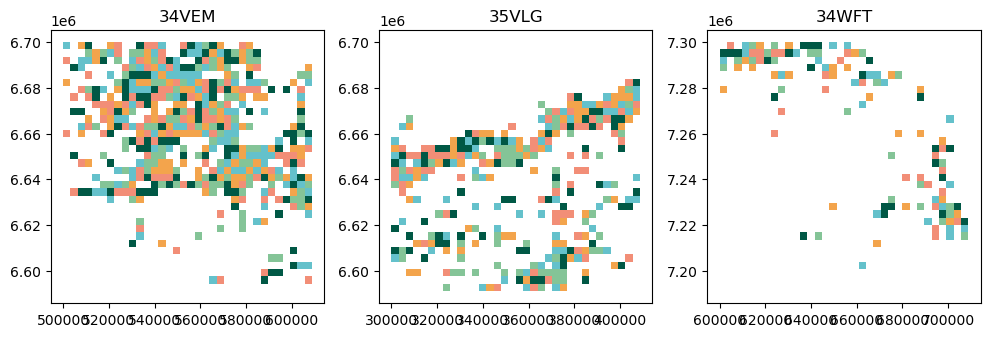

In [ ]:
from matplotlib.colors import ListedColormap

grid_34vem['fold'] = 'excluded'
grid_35vlg['fold'] = 'excluded'
grid_34wft['fold'] = 'excluded'
for i in range(5):
    grid_34vem['fold'] = grid_34vem.apply(lambda row: f'Fold {i+1}' if row.cell in folds_34VEM[i] else row.fold, axis=1)
    grid_35vlg['fold'] = grid_35vlg.apply(lambda row: f'Fold {i+1}' if row.cell in folds_35VLG[i] else row.fold, axis=1)
    grid_34wft['fold'] = grid_34wft.apply(lambda row: f'Fold {i+1}' if row.cell in folds_34WFT[i] else row.fold, axis=1)

fig, axs = plt.subplots(1,3, figsize=(12,5))

cmap = ListedColormap(["#005845", "#84C497", "#F28E77", "#64C1CB", "#F3A44C", 'white'])

grid_34vem.plot(column='fold', legend=False, ax=axs[0], cmap=cmap).set_title('34VEM')
grid_35vlg.plot(column='fold', legend=False, ax=axs[1], cmap=cmap).set_title('35VLG')
grid_34wft.plot(column='fold', legend=False, ax=axs[2], cmap=cmap).set_title('34WFT')

Finally construct the base `yolo.yaml` file for the dataset.

In [ ]:
with open(outpath/'yolo.yaml', 'w') as dest:
    dest.write('# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3: list: [path/to_imgs1, path_to_imgs2, ..]\n')
    dest.write(f'path: {os.path.abspath(outpath)}/ # dataset root dir \n')
    dest.write(f"train: # train images (relative to 'path')\n")
    dest.write(f"  - fold_1.txt\n")
    dest.write(f"  - fold_2.txt\n")
    dest.write(f"  - fold_3.txt\n")
    dest.write(f"  - fold_4.txt\n")
    dest.write(f"val: # val images (relative to 'path')\n")
    dest.write(f"  - fold_5.txt\n")
    dest.write(f"test: # test images (relative to 'path')\n")
    dest.write('\n# Classes\n')
    dest.write('names:\n')
    dest.write('  0: boat')           